In [4]:
!pip install ultralytics

import os
import pandas as pd
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import cv2

In [9]:
# Define paths
IMG_ROOT = '/kaggle/input/data/training_images'
ANNOTATION_FILE = '/kaggle/input/data/train_solution_bounding_boxes (1).csv'
OUTPUT_DIR = '/kaggle/working/yolo_dataset'

# Read the annotations
df = pd.read_csv(ANNOTATION_FILE)
df = df.rename(columns={'image': 'ImageID'})

# Split data into train, validation, and test
unique_images = df.ImageID.unique()
train_ids, temp_ids = train_test_split(unique_images, test_size=0.2, random_state=99)
val_ids, test_ids = train_test_split(temp_ids, test_size=0.3, random_state=99)

train_df = df[df['ImageID'].isin(train_ids)]
val_df = df[df['ImageID'].isin(val_ids)]
test_df = df[df['ImageID'].isin(test_ids)]

In [10]:
os.listdir('/kaggle/input/data')

['sample_submission.csv',
 'testing_images',
 'train_solution_bounding_boxes (1).csv',
 'training_images']

In [11]:
# Create YOLO format labels
def create_yolo_labels(df, image_dir, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    labels_dir = os.path.join(output_dir, 'labels')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(labels_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)

    for image_id in tqdm(df.ImageID.unique(), desc="Processing Images"):
        img_path = os.path.join(image_dir, image_id)
        img = cv2.imread(img_path)
        h, w, _ = img.shape

        # Save image to YOLO dataset directory
        cv2.imwrite(os.path.join(images_dir, image_id), img)

        # Process bounding boxes
        bboxes = df[df['ImageID'] == image_id][['xmin', 'ymin', 'xmax', 'ymax']].values
        with open(os.path.join(labels_dir, f"{image_id.split('.')[0]}.txt"), 'w') as f:
            for xmin, ymin, xmax, ymax in bboxes:
                x_center = ((xmin + xmax) / 2) / w
                y_center = ((ymin + ymax) / 2) / h
                box_width = (xmax - xmin) / w
                box_height = (ymax - ymin) / h
                f.write(f"0 {x_center} {y_center} {box_width} {box_height}\n")

# Create datasets
create_yolo_labels(train_df, IMG_ROOT, os.path.join(OUTPUT_DIR, 'train'))
create_yolo_labels(val_df, IMG_ROOT, os.path.join(OUTPUT_DIR, 'val'))
create_yolo_labels(test_df, IMG_ROOT, os.path.join(OUTPUT_DIR, 'test'))

Processing Images: 100%|██████████| 22/22 [00:00<00:00, 73.99it/s]


In [12]:
# Create data.yaml file
data_yaml = f"""
train: {os.path.join(OUTPUT_DIR, 'train/images')}
val: {os.path.join(OUTPUT_DIR, 'val/images')}
test: {os.path.join(OUTPUT_DIR, 'test/images')}
nc: 1
names: ['car']
"""

with open(os.path.join(OUTPUT_DIR, 'data.yaml'), 'w') as f:
    f.write(data_yaml)

In [13]:
# Train YOLOv8 model
from ultralytics import YOLO

# Initialize and train
model = YOLO('yolov8n.pt')  # Use a YOLOv8 pre-trained model
results = model.train(
    data=os.path.join(OUTPUT_DIR, 'data.yaml'), 
    epochs=15, 
    batch=16, 
    imgsz=640, 
    device='0'
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 18.3MB/s]


Ultralytics 8.3.51 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/yolo_dataset/data.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=T

100%|██████████| 755k/755k [00:00<00:00, 4.13MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 15.9MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/yolo_dataset/train/labels... 284 images, 0 backgrounds, 0 corrupt: 100%|██████████| 284/284 [00:00<00:00, 1205.22it/s]

train: New cache created: /kaggle/working/yolo_dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/yolo_dataset/val/labels... 49 images, 0 backgrounds, 0 corrupt: 100%|██████████| 49/49 [00:00<00:00, 930.51it/s]

val: New cache created: /kaggle/working/yolo_dataset/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      2.35G      1.493      2.626      1.134         33        640: 100%|██████████| 18/18 [00:04<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         49         75    0.00503      0.987      0.926      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.32G      1.295      1.453      1.077         30        640: 100%|██████████| 18/18 [00:03<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.67it/s]

                   all         49         75    0.00511          1      0.611      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.32G      1.317      1.216      1.101         40        640: 100%|██████████| 18/18 [00:03<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.68it/s]

                   all         49         75    0.00497      0.973      0.702      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.31G      1.222      1.142      1.082         30        640: 100%|██████████| 18/18 [00:03<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.40it/s]

                   all         49         75          1      0.697      0.899      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.31G      1.259      1.082      1.093         30        640: 100%|██████████| 18/18 [00:03<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.18it/s]

                   all         49         75          1      0.925      0.986      0.603


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.32G      1.322      1.471      1.124         20        640: 100%|██████████| 18/18 [00:04<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.56it/s]

                   all         49         75      0.986      0.932      0.988      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.31G      1.217      1.259        1.1         14        640: 100%|██████████| 18/18 [00:03<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.13it/s]

                   all         49         75      0.959      0.948      0.981      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      2.32G       1.19       1.18      1.095         17        640: 100%|██████████| 18/18 [00:03<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.03it/s]

                   all         49         75      0.981      0.907      0.984      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.31G      1.231      1.126      1.115         15        640: 100%|██████████| 18/18 [00:03<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.22it/s]

                   all         49         75       0.96      0.956       0.99      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      2.32G      1.151      1.015      1.063         22        640: 100%|██████████| 18/18 [00:03<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.29it/s]

                   all         49         75      0.971       0.96       0.99      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      2.31G      1.185     0.9929      1.084         16        640: 100%|██████████| 18/18 [00:03<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.00it/s]

                   all         49         75      0.961      0.984      0.992      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      2.32G      1.141      0.945      1.074         17        640: 100%|██████████| 18/18 [00:03<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.56it/s]

                   all         49         75      0.974      0.983      0.992       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      2.31G      1.102      0.885       1.05         15        640: 100%|██████████| 18/18 [00:03<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.90it/s]

                   all         49         75      0.972      0.973      0.988      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      2.32G      1.101     0.8687      1.043         17        640: 100%|██████████| 18/18 [00:03<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.44it/s]

                   all         49         75      0.974      0.984      0.992      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      2.31G      1.097     0.8501      1.028         18        640: 100%|██████████| 18/18 [00:03<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.71it/s]

                   all         49         75      0.985      0.973      0.993       0.65



15 epochs completed in 0.019 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.51 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.24it/s]


                   all         49         75      0.985      0.973      0.993       0.65
Speed: 0.1ms preprocess, 1.3ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train


Available columns in results.csv: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


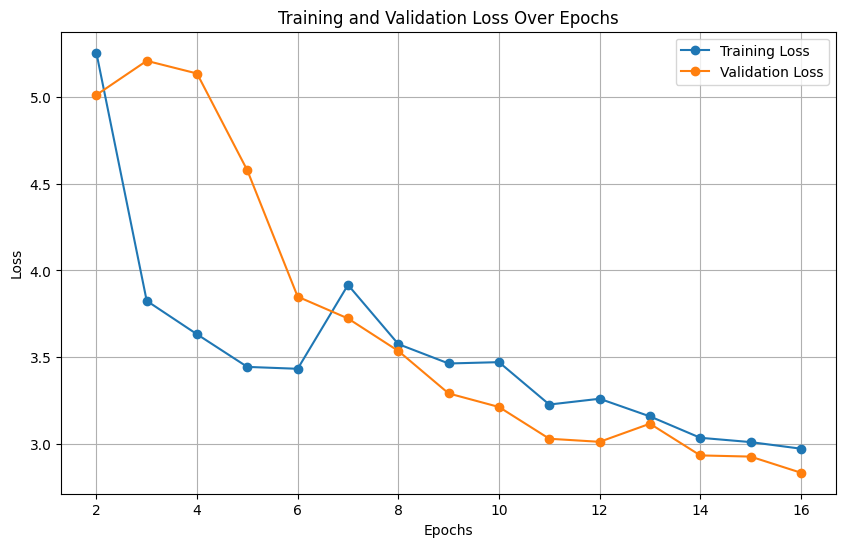

In [15]:
import matplotlib.pyplot as plt
results_csv_path = os.path.join(results.save_dir, "results.csv")

# Load and inspect training metrics
if os.path.exists(results_csv_path):
    metrics_df = pd.read_csv(results_csv_path)

    print(f"Available columns in results.csv: {list(metrics_df.columns)}")

    # Calculate total training and validation loss
    training_loss = (
        metrics_df["train/box_loss"] + metrics_df["train/cls_loss"] + metrics_df["train/dfl_loss"]
    )
    validation_loss = (
        metrics_df["val/box_loss"] + metrics_df["val/cls_loss"] + metrics_df["val/dfl_loss"]
    )
    epochs = metrics_df["epoch"] + 1

    # Plot the losses
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, training_loss, label="Training Loss", marker="o")
    plt.plot(epochs, validation_loss, label="Validation Loss", marker="o")
    plt.title("Training and Validation Loss Over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid()
    plt.show()
else:
    print(f"Results CSV file not found at {results_csv_path}")

In [16]:
# Validate the model
val_results = model.val()

Ultralytics 8.3.51 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/yolo_dataset/val/labels.cache... 49 images, 0 backgrounds, 0 corrupt: 100%|██████████| 49/49 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.54it/s]


                   all         49         75      0.985      0.973      0.993      0.649
Speed: 0.1ms preprocess, 7.0ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/train2


In [17]:

# Test the model
test_images_path = os.path.join(OUTPUT_DIR, 'test/images')
test_results = model.predict(source=test_images_path, conf=0.5, save=True)



image 1/22 /kaggle/working/yolo_dataset/test/images/vid_4_10020.jpg: 384x640 1 car, 36.5ms
image 2/22 /kaggle/working/yolo_dataset/test/images/vid_4_10120.jpg: 384x640 1 car, 6.4ms
image 3/22 /kaggle/working/yolo_dataset/test/images/vid_4_12280.jpg: 384x640 3 cars, 6.0ms
image 4/22 /kaggle/working/yolo_dataset/test/images/vid_4_12380.jpg: 384x640 1 car, 6.0ms
image 5/22 /kaggle/working/yolo_dataset/test/images/vid_4_12480.jpg: 384x640 1 car, 6.1ms
image 6/22 /kaggle/working/yolo_dataset/test/images/vid_4_13580.jpg: 384x640 (no detections), 6.3ms
image 7/22 /kaggle/working/yolo_dataset/test/images/vid_4_16000.jpg: 384x640 1 car, 6.1ms
image 8/22 /kaggle/working/yolo_dataset/test/images/vid_4_17180.jpg: 384x640 1 car, 6.1ms
image 9/22 /kaggle/working/yolo_dataset/test/images/vid_4_17580.jpg: 384x640 2 cars, 6.0ms
image 10/22 /kaggle/working/yolo_dataset/test/images/vid_4_1860.jpg: 384x640 3 cars, 6.0ms
image 11/22 /kaggle/working/yolo_dataset/test/images/vid_4_18820.jpg: 384x640 1 car, 

/kaggle/working/yolo_dataset/test/images/vid_4_10020.jpg


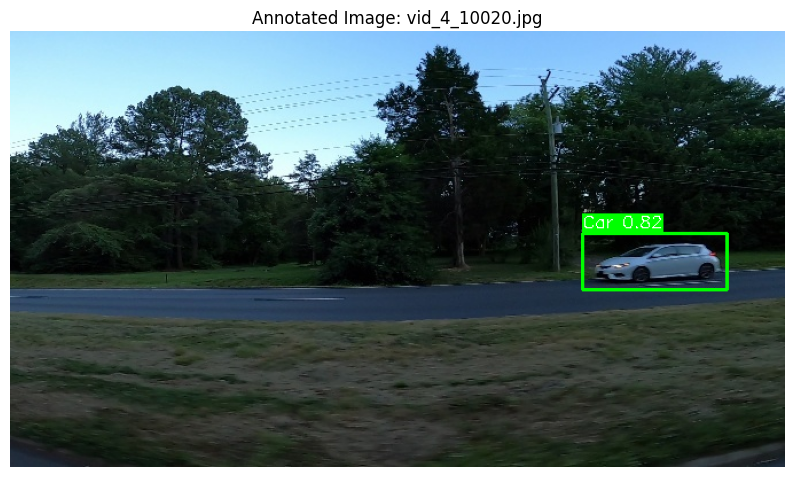

/kaggle/working/yolo_dataset/test/images/vid_4_10120.jpg


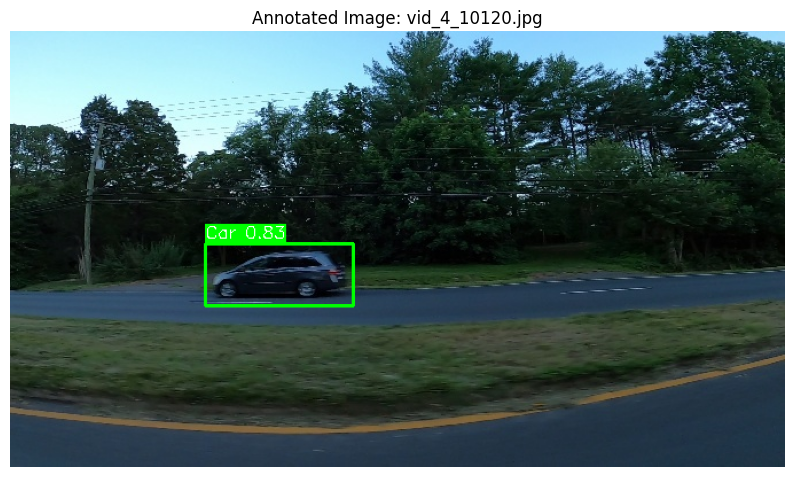

/kaggle/working/yolo_dataset/test/images/vid_4_12280.jpg


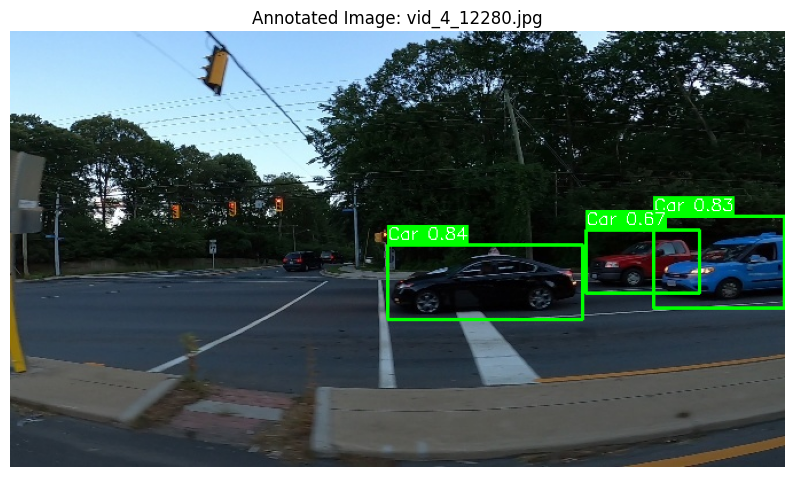

/kaggle/working/yolo_dataset/test/images/vid_4_12380.jpg


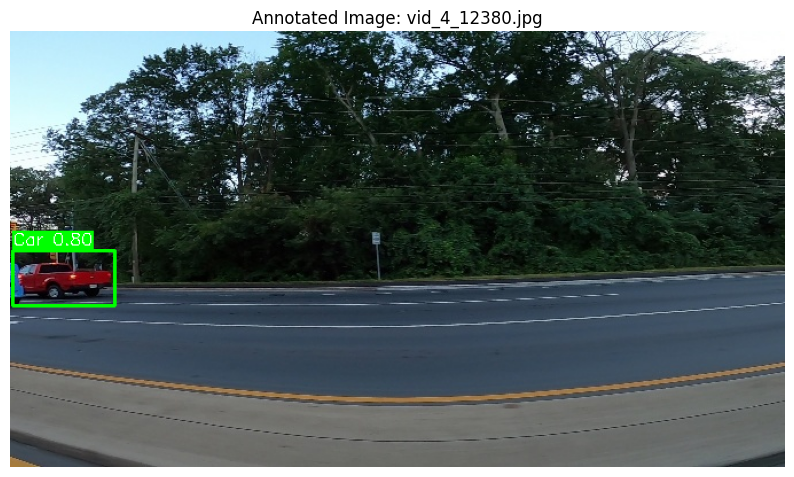

/kaggle/working/yolo_dataset/test/images/vid_4_12480.jpg


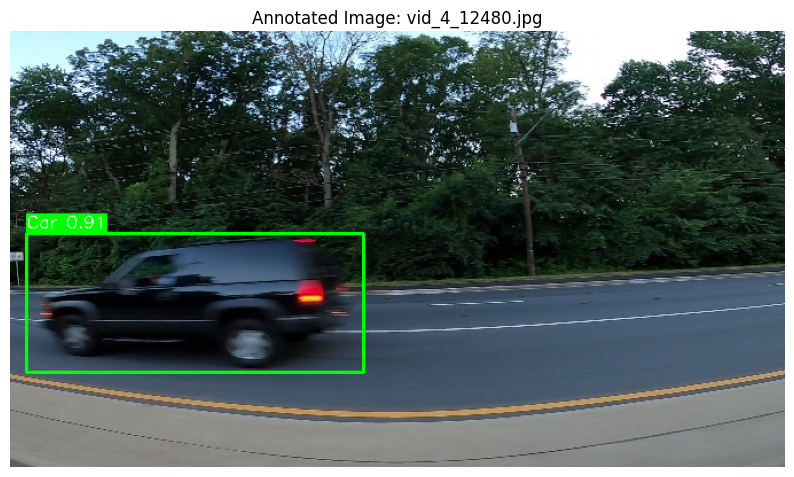

/kaggle/working/yolo_dataset/test/images/vid_4_13580.jpg


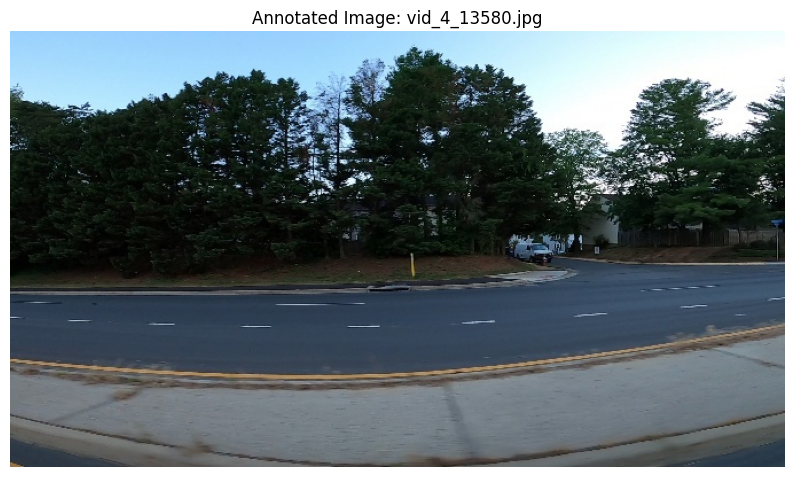

/kaggle/working/yolo_dataset/test/images/vid_4_16000.jpg


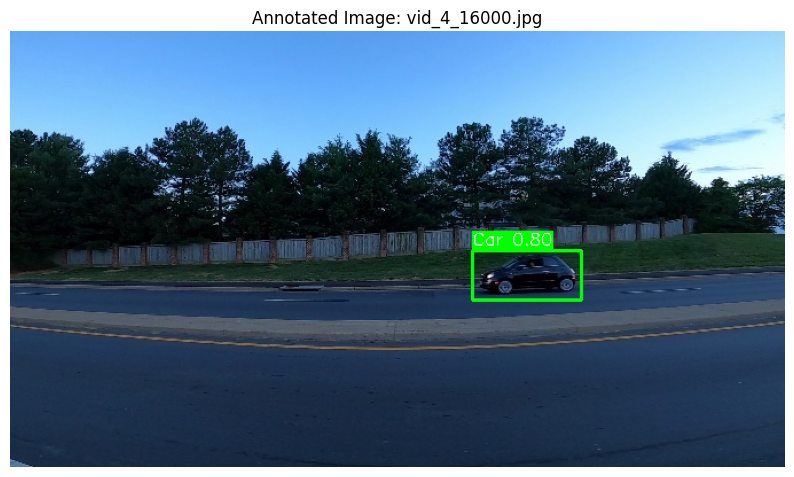

/kaggle/working/yolo_dataset/test/images/vid_4_17180.jpg


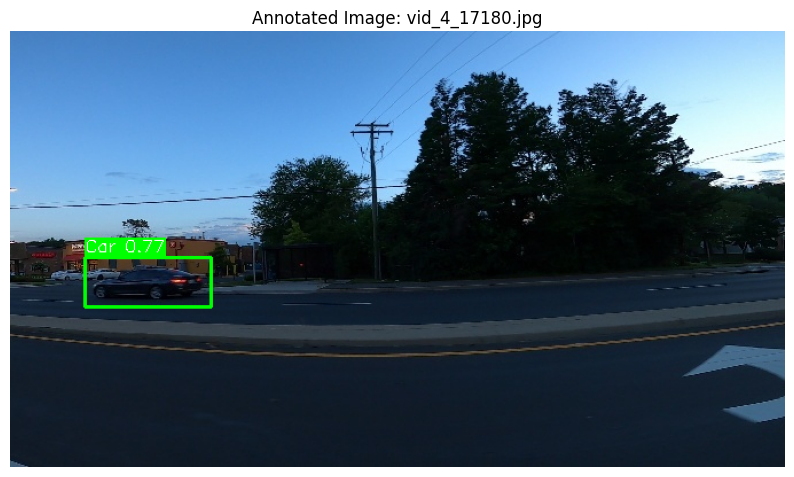

/kaggle/working/yolo_dataset/test/images/vid_4_17580.jpg


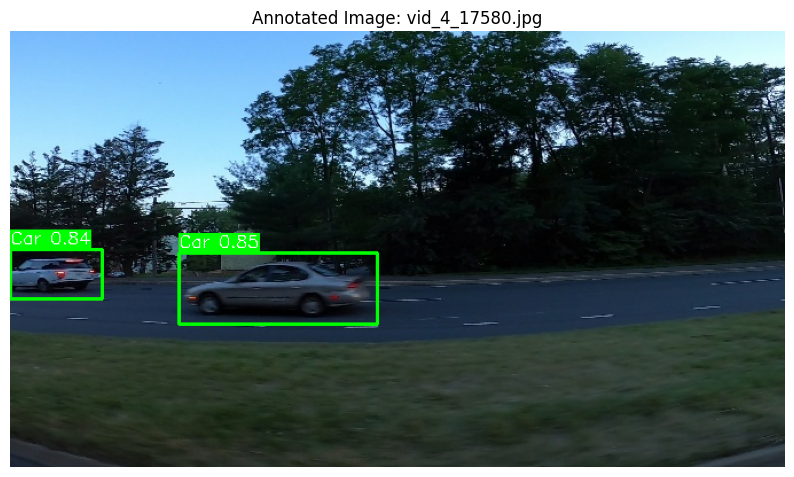

/kaggle/working/yolo_dataset/test/images/vid_4_1860.jpg


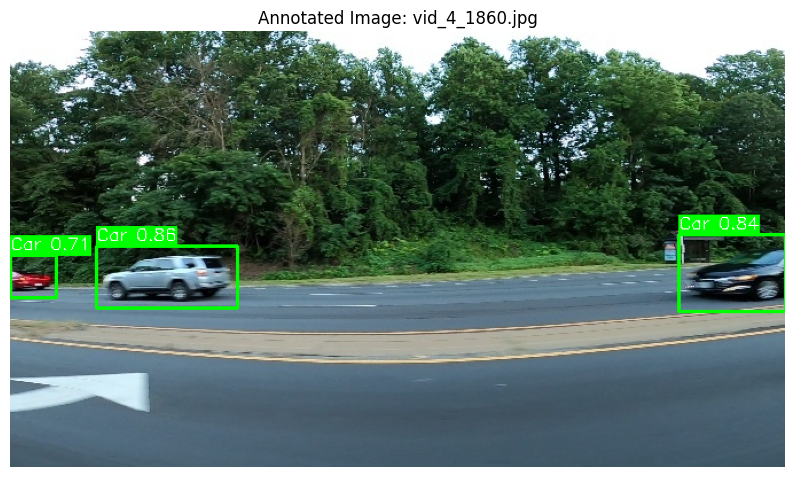

/kaggle/working/yolo_dataset/test/images/vid_4_18820.jpg


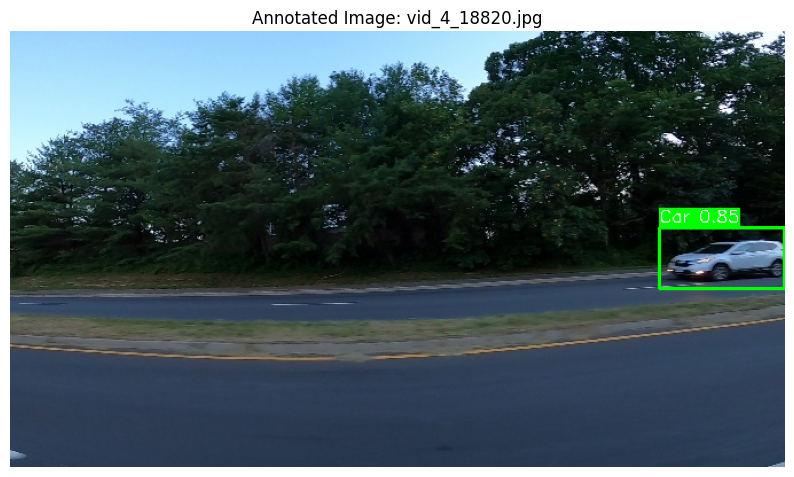

/kaggle/working/yolo_dataset/test/images/vid_4_19040.jpg


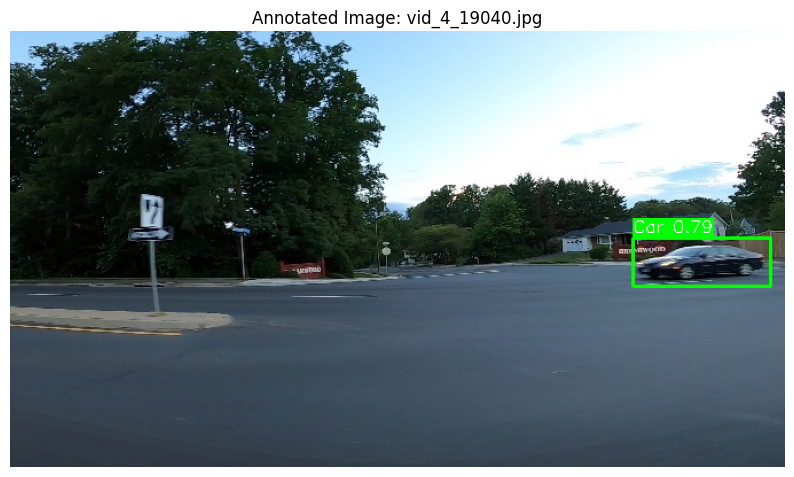

/kaggle/working/yolo_dataset/test/images/vid_4_21280.jpg


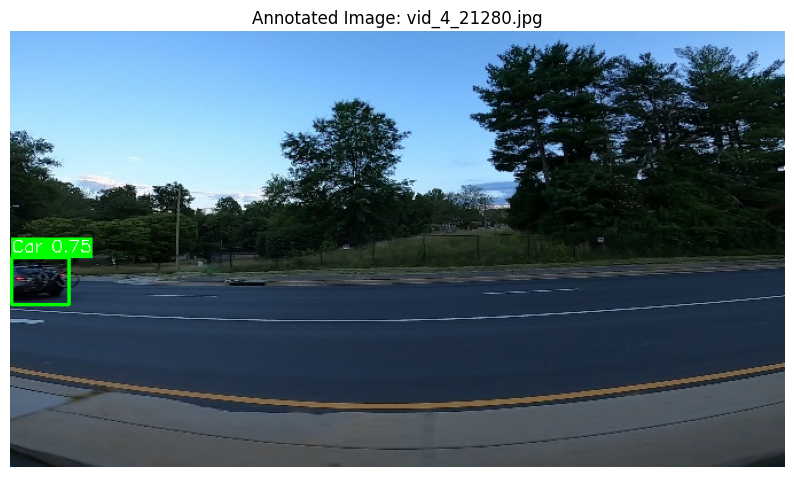

/kaggle/working/yolo_dataset/test/images/vid_4_21620.jpg


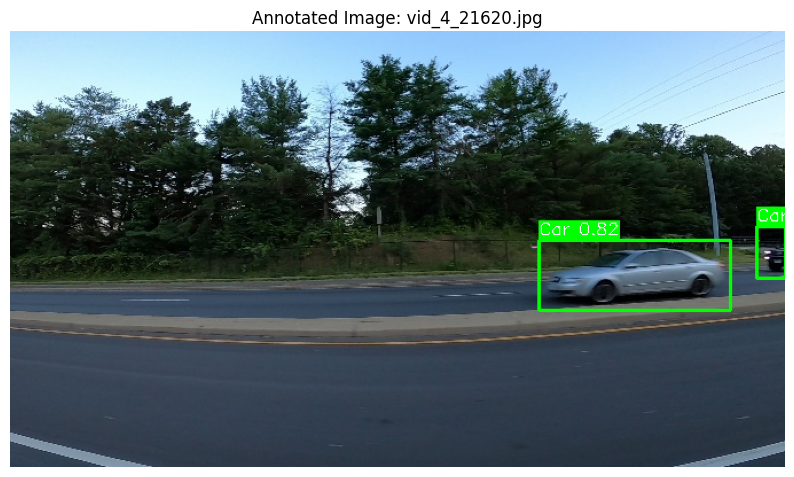

/kaggle/working/yolo_dataset/test/images/vid_4_2400.jpg


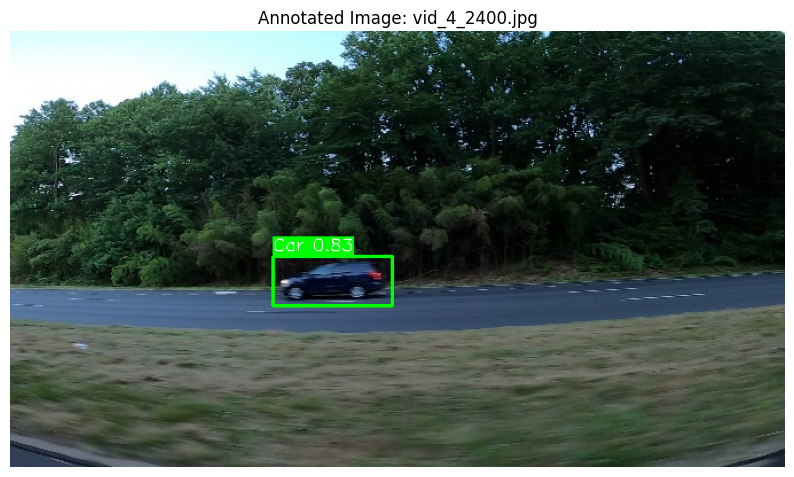

/kaggle/working/yolo_dataset/test/images/vid_4_26320.jpg


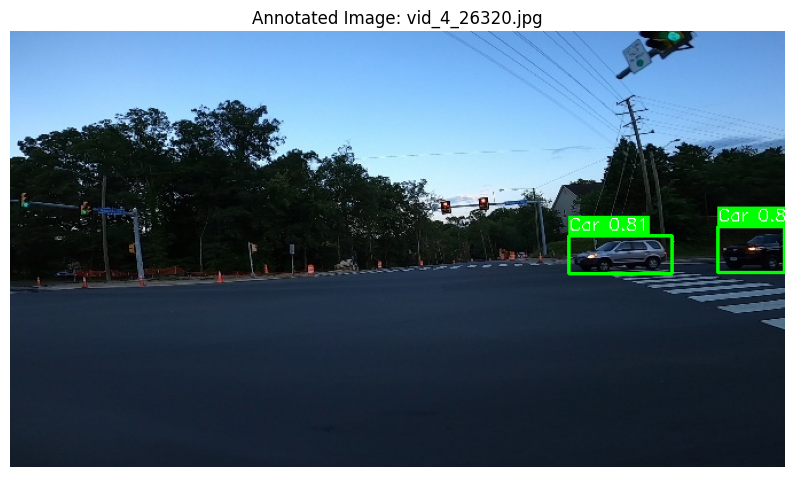

/kaggle/working/yolo_dataset/test/images/vid_4_26400.jpg


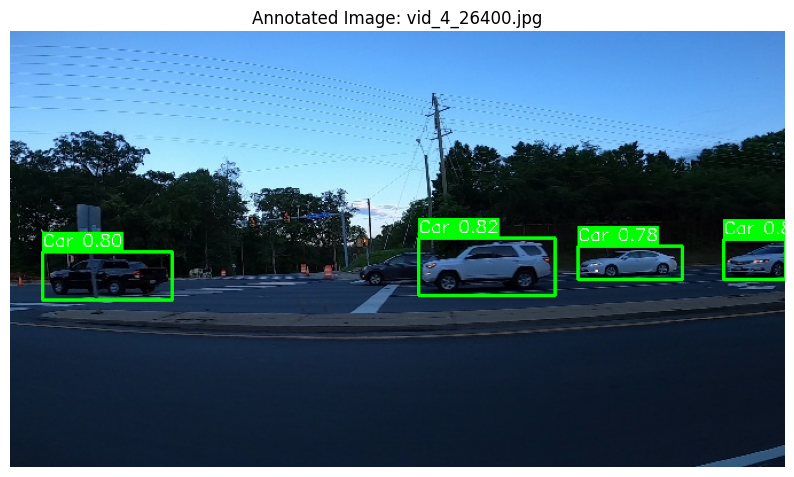

/kaggle/working/yolo_dataset/test/images/vid_4_28200.jpg


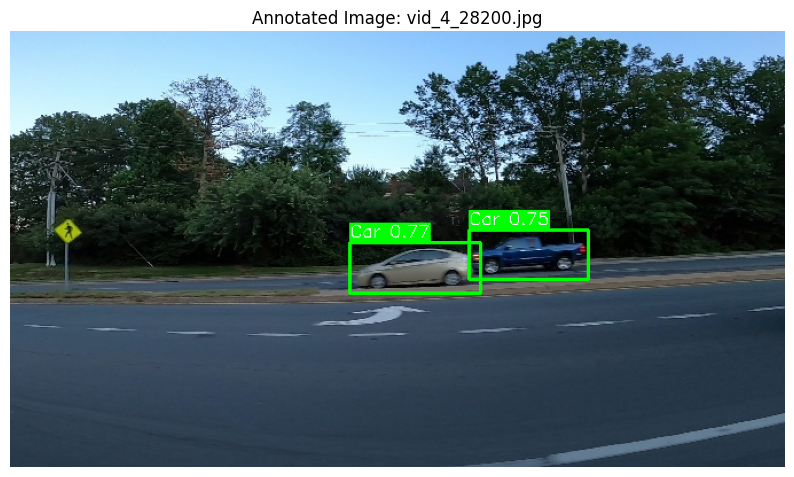

/kaggle/working/yolo_dataset/test/images/vid_4_3560.jpg


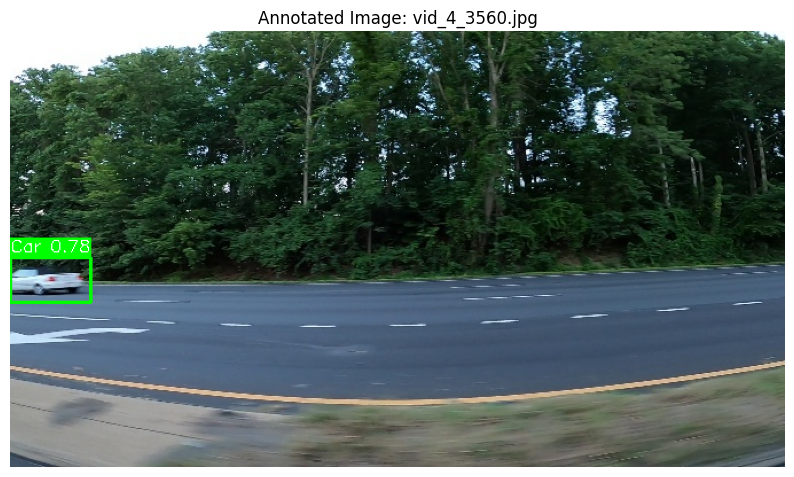

/kaggle/working/yolo_dataset/test/images/vid_4_3800.jpg


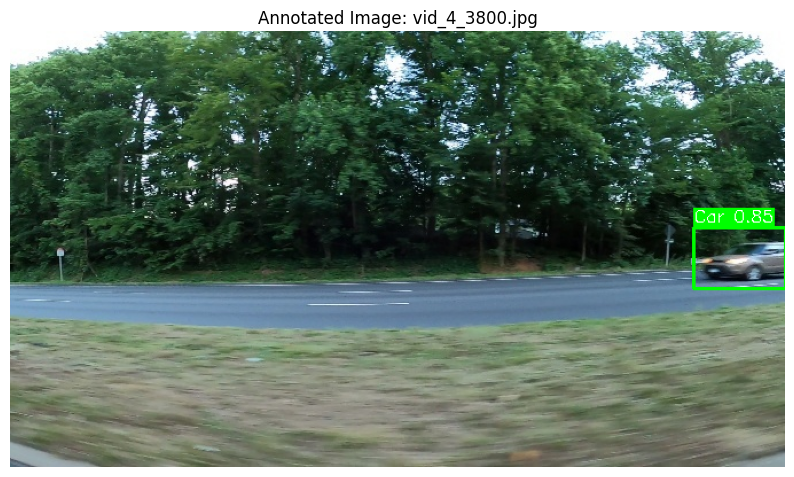

/kaggle/working/yolo_dataset/test/images/vid_4_6180.jpg


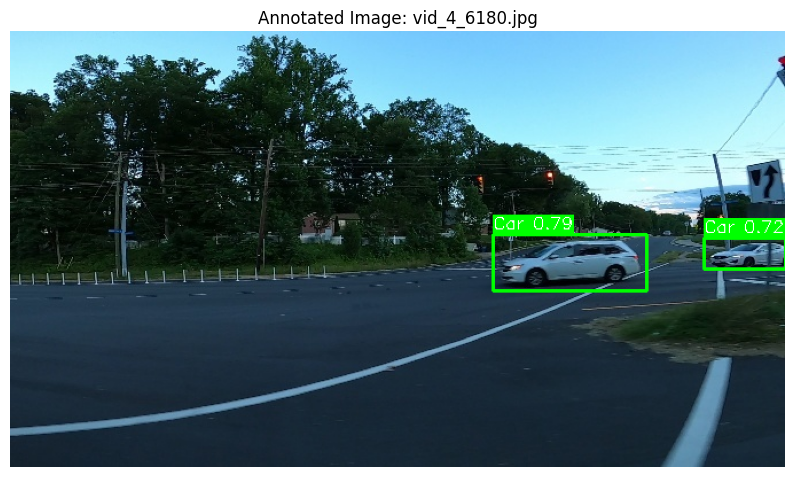

/kaggle/working/yolo_dataset/test/images/vid_4_9320.jpg


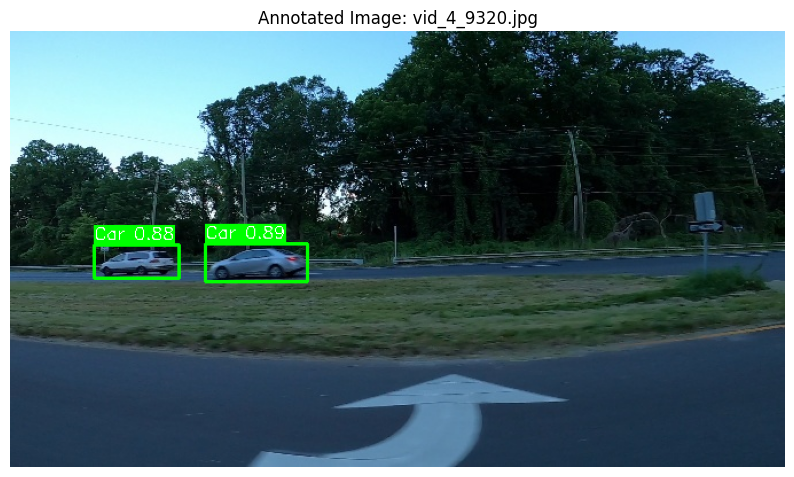

Annotated images are saved in: /kaggle/working/yolo_dataset/test_with_boxes


In [18]:
# Function to draw bounding boxes on an image
def draw_boxes(image_path, boxes, confidences, class_ids, save_path):
    """
    Draws bounding boxes on the image and saves it.

    Args:
    - image_path: Path to the input image.
    - boxes: List of bounding boxes (x_min, y_min, x_max, y_max).
    - confidences: List of confidence scores for each bounding box.
    - class_ids: List of class IDs for each bounding box.
    - save_path: Path to save the output image with bounding boxes.
    """
    img = cv2.imread(image_path)
    for box, conf, cls in zip(boxes, confidences, class_ids):
        x_min, y_min, x_max, y_max = map(int, box)  # Bounding box coordinates
        label = f"Car {conf:.2f}" if cls == 0 else f"Unknown {conf:.2f}"
        color = (0, 255, 0)  # Green bounding box
        thickness = 2

        # Draw rectangle
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, thickness)

        # Add label
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        label_size, baseline = cv2.getTextSize(label, font, font_scale, 1)
        top_left = (x_min, y_min - label_size[1] - baseline)
        bottom_right = (x_min + label_size[0], y_min)
        cv2.rectangle(img, top_left, bottom_right, color, -1)
        cv2.putText(img, label, (x_min, y_min - baseline), font, font_scale, (255, 255, 255), 1)

    cv2.imwrite(save_path, img)
    return img

# Iterate through the test images and draw boxes
output_dir = os.path.join(OUTPUT_DIR, "test_with_boxes")
os.makedirs(output_dir, exist_ok=True)

for result in test_results:  # Iterate through each result
    image_path = result.path  # Get the image path
    boxes = result.boxes.xyxy.cpu().numpy()  # Get bounding box coordinates
    confidences = result.boxes.conf.cpu().numpy()  # Get confidence scores
    class_ids = result.boxes.cls.cpu().numpy().astype(int)  # Get class IDs
    save_path = os.path.join(output_dir, os.path.basename(image_path))
    print(image_path)
    annotated_img = draw_boxes(image_path, boxes, confidences, class_ids, save_path)
    

    # Display the annotated image
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
    plt.axis('off')
    plt.title(f"Annotated Image: {os.path.basename(image_path)}")
    plt.show()

print(f"Annotated images are saved in: {output_dir}")